# Analyse des données de Berkeley earth

### Introduction

<blockquote style="border-left: 5px solid #686a91;">
Les données sources traitées dans ce notebooks proviennent des Data Sets disponibles sur le site de Berkeley Earth. 
Cette organisation indépendante américaine se consacre à la science des données environnementales et agrège différentes sources, notamment l'analyse GISTEMP réalisée sous l'égide de la NASA.

Pour nos analyses, nous utilisons les ensembles de données suivants :

Températures globales :
<ul>
    <li>Complete_TAVG_complete.txt : il s'agit de la liste des températures globales moyennes sur les terres.</li>
</ul> 
Températures par hémisphère :
<ul>
    <li>northern-hemisphere-TAVG-Trend.txt : cette liste contient les températures moyennes de l'hémisphère nord.</li>

   <li>southern-hemisphere-TAVG-Trend.txt : il s'agit de la liste des températures moyennes de l'hémisphère sud.</li>
</ul>    
Ces fichiers contienent un résumé détaillé des résultats moyens de la surface terrestre obtenus par la méthode de calcul de Berkeley. Les températures sont en degrés Celsius et sont rapportées en tant qu'anomalies par rapport à la moyenne de janvier 1951 à décembre 1980. Les incertitudes représentent l'intervalle de confiance à 95% pour les effets de sous-échantillonnage statistique et spatial. Cette période a été sélectonnée en raison de sa fiabilité et de son exhaustivité en termes d'observations, mais surtout parce qu'elle représente une médiane pour l'ensemble des données du jeu de données. En règle générale, la moitié des données se situent en dessous de ces valeurs de référence, tandis que l'autre moitié se trouve au-dessus. 
</blocquote>

<div class="alert alert-info">
<i class="fa fa-info-circle"></i>   
Ce notebook a été exécuté en local tout au long du travail. Pour exécuter ce notebook dans Colab, merci de lire les instructions afférentes
</div>


Pour charger le fichier dans colab, suivez les étapes ci-après:
<blockquote style="border-left: 5px solid #686a91;">
<ul> 
<li> disposer du lien du dossier partagé, cliquer sur le lien, se connecter à son drive puis faire un clic droit
<li> cliquer sur ajouter un raccourci dans Drive
<li> "Mounter" votre gdrive
<li> Importer os puis exécuter les codes en prenant soin de remplacer l'id dans le path (path = "/gdrive/.shortcut-targets-by-id/ID_dossier_partage/nom_dossier")
<li> Exécuter les codes ci dessous ci-vous avez suivi les étapes 1 et 2
</blockquote>
Si vous n'êtes pas dans colab, veuillez ignorer cette information

In [1]:
# Import des packages

import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline
import pandas as pd
import plotly.offline as pyo
from plotly.subplots import make_subplots
import plotly.graph_objs as go

import warnings
warnings.filterwarnings('ignore')

<blockquote style="border-left: 5px solid #686a91;">Les colonnes qui nous intéresent pour notre analyse sont : l'année (year); le mois (month); l'anomaly global (anomaly-Gl) et l'incertitude (Uncertainty-Gl).</blocquote>

In [2]:
#  delimiter='\s+' : permet de lire correctement un fichier CSV où les valeurs sont séparées par 
# des espaces au lieu de virgules ou de points-virgules.

headers = ['Year', 'Month', 'Anomaly-Gl', 'Uncertainty-Gl']

df = pd.read_csv('Complete_TAVG_complete.txt', header = 33, sep='\s+', names = headers, index_col=False)
df

,Year,Month,Anomaly-Gl,Uncertainty-Gl
0,1750,1,-0.490,3.240
1,1750,2,-1.029,3.620
2,1750,3,0.211,3.079
3,1750,4,-0.166,1.671
4,1750,5,-1.589,2.514
...,...,...,...,...
3260,2021,9,1.290,0.065
3261,2021,10,1.594,0.072
3262,2021,11,1.333,0.055
3263,2021,12,1.351,0.092


In [3]:
df = df.rename({'Year':'year' ,'Month':'month', 'Anomaly-Gl':'anomaly', 'Uncertainty-Gl':'uncert'}, axis=1)
df.head()

,year,month,anomaly,uncert
0,1750,1,-0.490,3.240
1,1750,2,-1.029,3.620
2,1750,3,0.211,3.079
3,1750,4,-0.166,1.671
4,1750,5,-1.589,2.514


<blockquote style="border-left: 5px solid #686a91;">Pour déterminer la température absolue d'un mois spécifique, il est nécessaire d'ajouter la valeur d'anomalie correspondante du même mois dans la liste de référence des températures (période 1951-1980). 
Les références nous permettent de calculer les températures en termes de valeurs absolues. Ces références sont stockées dans l'entête du fichier de donnée téléchargé.
</blocquote>

In [4]:
# les références sont à retrouver dans le fichier d'origine txt à partir de la ligne 54 et 55 du jeux de données

mois = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ref = [2.60, 3.20, 5.29, 8.28, 11.27, 13.42, 14.30, 13.84, 12.05, 9.21, 6.08, 3.63]
month = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

df_ref = pd.DataFrame({'mois': mois, 'ref': ref, 'month': month})
df_ref

,mois,ref,month
0,Jan,2.60,1
1,Feb,3.20,2
2,Mar,5.29,3
3,Apr,8.28,4
4,May,11.27,5
5,Jun,13.42,6
6,Jul,14.30,7
7,Aug,13.84,8
8,Sep,12.05,9
9,Oct,9.21,10


In [5]:
print(df.shape)
print("-----------")
print(df_ref.shape)

(3265, 4)
-----------
(12, 3)


In [6]:
for index, row in df.iterrows():
    month = row['month']
    valeur = df_ref.loc[df_ref['month'] == month]['ref'].values[0]
    df.loc[index, 'ref'] = valeur
df["temp_abs"] = df["anomaly"] + df["ref"]
df = df.drop("ref", axis = 1)
df.head()
  

,year,month,anomaly,uncert,temp_abs
0,1750,1,-0.490,3.240,2.110
1,1750,2,-1.029,3.620,2.171
2,1750,3,0.211,3.079,5.501
3,1750,4,-0.166,1.671,8.114
4,1750,5,-1.589,2.514,9.681


In [7]:
df.insert(0, 'date', pd.to_datetime(df['year'].map(str) + '-' + df['month'].map(str) + '-15'))


In [8]:
df.head()

,date,year,month,anomaly,uncert,temp_abs
0,1750-01-15,1750,1,-0.490,3.240,2.110
1,1750-02-15,1750,2,-1.029,3.620,2.171
2,1750-03-15,1750,3,0.211,3.079,5.501
3,1750-04-15,1750,4,-0.166,1.671,8.114
4,1750-05-15,1750,5,-1.589,2.514,9.681


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3265 entries, 0 to 3264
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   date      3265 non-null   datetime64[ns]
 1   year      3265 non-null   int64         
 2   month     3265 non-null   int64         
 3   anomaly   3264 non-null   float64       
 4   uncert    3262 non-null   float64       
 5   temp_abs  3264 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(2)
memory usage: 153.2 KB


In [10]:
df.isna().sum()

date        0
year        0
month       0
anomaly     1
uncert      3
temp_abs    1
dtype: int64

<blockquote style="border-left: 5px solid #686a91;">Nous choisissons de remplir les colonnes manquantes par la moyenne. En raison du faible nombre de données manquantes, ce choix n'aura pas d'effet négatif sur les calculs.</blocquote>

In [11]:
df = df.fillna(df.mean())

In [12]:
df.isna().sum()

date        0
year        0
month       0
anomaly     0
uncert      0
temp_abs    0
dtype: int64

<blockquote style="border-left: 5px solid #686a91;">Nous avons à présent une donnée propre pour travailler

In [13]:
df.iloc[:,3:].describe()

,anomaly,uncert,temp_abs
count,3265.000000,3265.000000,3265.000000
mean,-0.265392,0.902632,8.329213
std,0.960997,1.042774,4.329624
min,-6.018000,0.022000,-2.423000
25%,-0.701000,0.173000,4.291000
50%,-0.197000,0.386000,8.560000
75%,0.244000,1.384000,12.414000
max,5.531000,6.521000,17.780000


<blockquote style="border-left: 5px solid #686a91;">Les colonnes que nous n'avons pas retenus lors du chargement des données rapportent les anomalies et incertitudes sous la forme de moyennes glissantes annuelles, quinquennales, décennales et vicennales, centrées sur le mois considéré. Par exemple, la moyenne annuelle de janvier à décembre 1950 est rapportée à juin 1950, ce qui explique la présence de « NaNs » en début et fin de ces colonnes dans les Data Sets.

Nous avons faix le choix de calculer notre moyenne glissante par an (soit pour 12 mois glissants) avec la méthode rolling() de pandas</blocquote>

In [14]:
df['moy_mobile']=df['temp_abs'].rolling(12).mean()
df.head(20)

,date,year,month,anomaly,uncert,temp_abs,moy_mobile
0,1750-01-15,1750,1,-0.490,3.240000,2.110,NaN
1,1750-02-15,1750,2,-1.029,3.620000,2.171,NaN
2,1750-03-15,1750,3,0.211,3.079000,5.501,NaN
3,1750-04-15,1750,4,-0.166,1.671000,8.114,NaN
4,1750-05-15,1750,5,-1.589,2.514000,9.681,NaN
5,1750-06-15,1750,6,-1.050,1.078000,12.370,NaN
6,1750-07-15,1750,7,-0.158,2.715000,14.142,NaN
7,1750-08-15,1750,8,0.197,1.623000,14.037,NaN
8,1750-09-15,1750,9,-1.084,1.448000,10.966,NaN
9,1750-10-15,1750,10,-2.136,2.254000,7.074,NaN


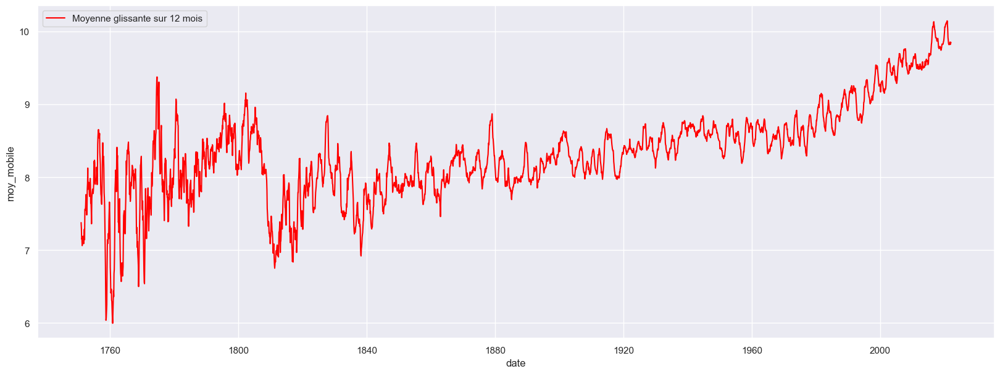

In [15]:
import seaborn as sns
sns.set_theme()
plt.figure(figsize=(20,7))

sns.lineplot(x='date', y='moy_mobile', data =df ,color='red', ci= None, label='Moyenne glissante sur 12 mois');

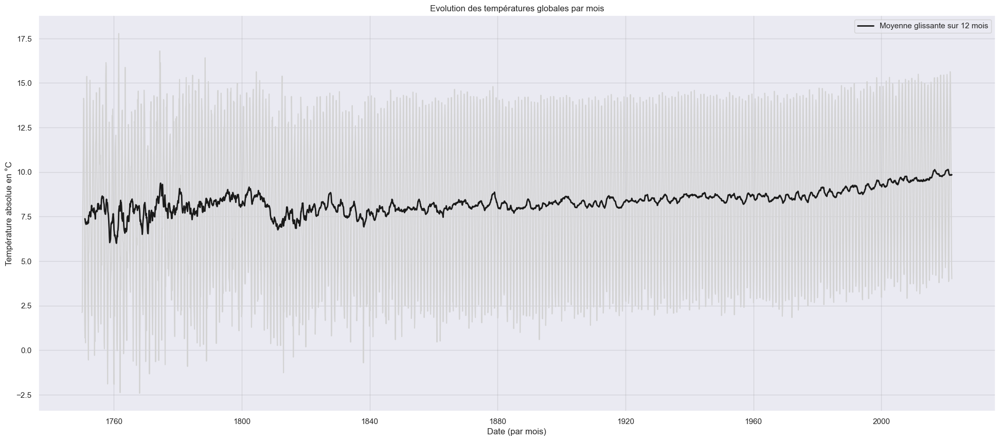

In [16]:
# 
plt.figure(figsize=(24,10))
plt.grid(color='grey', alpha=0.2)

# Display line for monthly measures
plt.plot(df['date'], df['temp_abs'], c='lightgrey', zorder=1)

# Display 12-months moving average as a straight, larger line.
plt.plot(df['date'], df['moy_mobile'], color='k', linewidth=2, label='Moyenne glissante sur 12 mois')

# Labels, legend, title.
plt.xlabel('Date (par mois)')
plt.ylabel('Température absolue en °C')
plt.legend()
plt.title('Evolution des températures globales par mois');

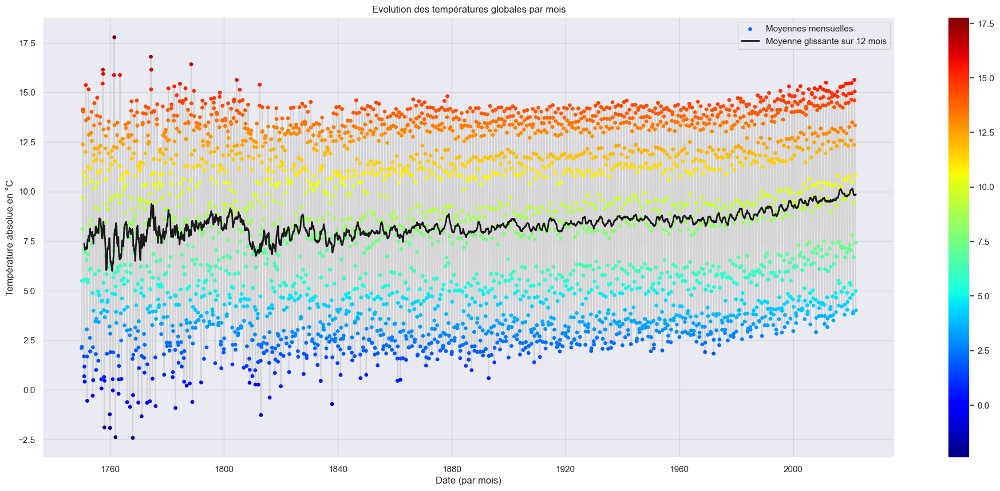

In [17]:
# Set the figure size and grid.
plt.figure(figsize=(24,10))
plt.grid(color='grey', alpha=0.2)

# Display line for monthly measures
plt.plot(df['date'], df['temp_abs'], c='lightgrey', zorder=1)
# Display points (circles) for monthly measures
plt.scatter(df['date'], df['temp_abs'], c=df['temp_abs'], cmap='jet', s=15, zorder=2,
          label='Moyennes mensuelles')
# Display 12-months moving average as a straight, larger line.
plt.plot(df['date'], df['moy_mobile'], color='k', linewidth=2, label='Moyenne glissante sur 12 mois')

# Add the cmap.
plt.colorbar()
plt.clim(df['temp_abs'].min(), df['temp_abs'].max())

# Labels, legend, title.
plt.xlabel('Date (par mois)')
plt.ylabel('Température absolue en °C')
plt.legend()
plt.title('Evolution des températures globales par mois');

<blockquote style="border-left: 5px solid #686a91;">On observe sur ce graphique des variations saisonales correspondant à chaque année, matérialisées par les bandes de couleurs. 
La moyenne glissante semble confirmer une hausse relativement constante des températures.</blocquote>

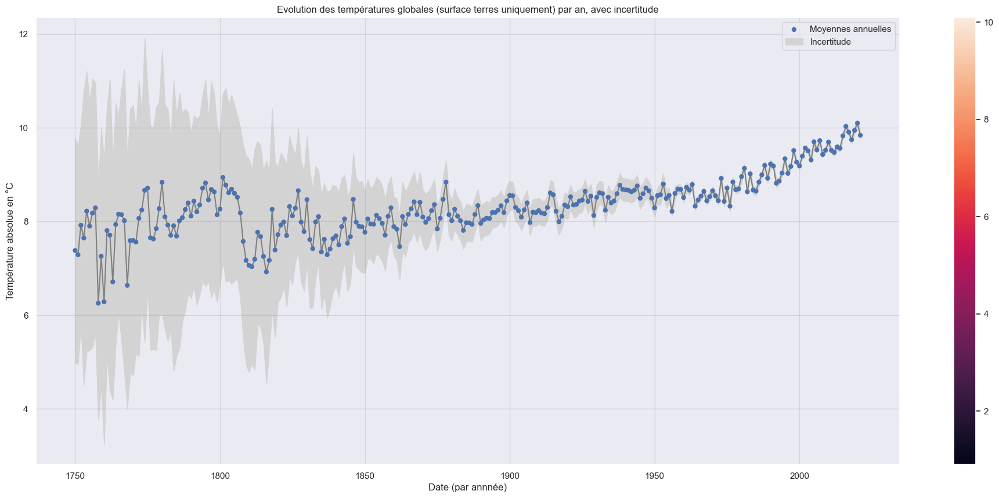

In [18]:
# Compute the average of abs and uncert by year.
temp_year = df[:-1][['year', 'temp_abs', 'uncert']].groupby('year').mean().reset_index()
# Set the figure size and grid.
plt.figure(figsize=(24,10))
plt.grid(color='grey', alpha=0.2)

# Display absolute temperatures.
plt.plot(temp_year['year'], temp_year['temp_abs'], c='grey', zorder=1)

plt.scatter(temp_year['year'], temp_year['temp_abs'],
      edgecolor='none', zorder=2, label='Moyennes annuelles')
plt.fill_between(temp_year['year'], 
         temp_year['temp_abs'] - temp_year['uncert'], 
         temp_year['temp_abs'] + temp_year['uncert'],
             color='#D3D3D3', zorder=0, label='Incertitude')
plt.colorbar()
plt.clim(temp_year['temp_abs'].min(), temp_year['temp_abs'].max())

# Labels, legend, title.
plt.xlabel('Date (par annnée)')
plt.ylabel('Température absolue en °C')
plt.title('Evolution des températures globales (surface terres uniquement) par an, avec incertitude')
plt.legend();

<blockquote style="border-left: 5px solid #686a91;">Ce graphique montre les températures moyennes par année avec la marge d'incertitude.</blocquote>

### Analyse des données par hémishères Nord et Sud

In [19]:
headers = ['Year', 'Month', 'Anomaly-NH', 'Uncertainty-NH']

df_North = pd.read_csv('northern-hemisphere-TAVG-Trend.txt', header = 69, sep='\s+', names = headers, index_col=False)
df_North = df_North.rename({'Year':'year' ,'Month':'month', 'Anomaly-NH':'north_anomaly', 'Uncertainty-NH':'north_uncert'}, axis=1)
df_North.head()


,year,month,north_anomaly,north_uncert
0,1840,1,0.447,1.333
1,1840,2,-0.821,1.100
2,1840,3,-1.050,1.503
3,1840,4,-0.455,0.622
4,1840,5,-0.002,0.829


In [20]:
# les références sont à retrouver dans le fichier d'origine txt à partir de la ligne 54 et 55 du jeux de données

mois = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ref = [-2.06, -0.04,  4.57, 10.35, 15.74, 19.67, 21.32, 20.21, 16.63, 10.99, 4.52, -0.38]
month = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

df_ref_North = pd.DataFrame({'mois': mois, 'ref': ref, 'month': month})

for index, row in df_North.iterrows():
    month = row['month']
    valeur = df_ref_North.loc[df_ref_North['month'] == month]['ref'].values[0]
    df_North.loc[index, 'ref'] = valeur

df_North["north_temp_abs"] = df_North["north_anomaly"] + df_North["ref"]

df_North['north_moy_mobile']=df_North['north_temp_abs'].rolling(12).mean()
df_North = df_North.drop("ref", axis = 1)
df_North.head(20)



,year,month,north_anomaly,north_uncert,north_temp_abs,north_moy_mobile
0,1840,1,0.447,1.333,-1.613,NaN
1,1840,2,-0.821,1.100,-0.861,NaN
2,1840,3,-1.050,1.503,3.520,NaN
3,1840,4,-0.455,0.622,9.895,NaN
4,1840,5,-0.002,0.829,15.738,NaN
5,1840,6,-0.079,0.632,19.591,NaN
6,1840,7,0.233,0.668,21.553,NaN
7,1840,8,-0.721,0.905,19.489,NaN
8,1840,9,-1.003,0.680,15.627,NaN
9,1840,10,-1.830,0.730,9.160,NaN


In [21]:
# importation du jeu de données des températures de l'hémisphère Sund: southern-hemisphere-TAVG-Trend.txt
headers_2 = ['Year', 'Month', 'Anomaly-SH', 'Uncertainty-SH']

df_South = pd.read_csv('southern-hemisphere-TAVG-Trend.txt', header = 69, sep='\s+', names = headers_2, index_col=False)
df_South["Year"] = df_South["Year"].astype("int")
df_South = df_South.rename({'Year':'year', 'Month':'month', 'Anomaly-SH':'south_anomaly', 'Uncertainty-SH':'south_uncert'}, axis=1)
df_South

,year,month,south_anomaly,south_uncert
0,1880,8,0.323,0.693
1,1880,9,-0.712,0.653
2,1880,10,-0.688,0.692
3,1880,11,-0.206,0.696
4,1880,12,-0.357,0.726
...,...,...,...,...
1680,2020,8,1.299,0.106
1681,2020,9,1.709,0.149
1682,2020,10,1.330,0.151
1683,2020,11,1.440,0.217


In [22]:
# les références sont à retrouver dans le fichier d'origine txt à partir de la ligne 54 et 55 du jeux de données

mois = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ref = [ 20.81, 20.10, 18.76, 16.60, 14.57, 12.81, 12.34, 13.50, 15.48, 17.41, 19.30, 20.44]
month = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

df_ref_South = pd.DataFrame({'mois': mois, 'ref': ref, 'month': month})

df_South["year"] = df_South["year"].astype(int)

for index, row in df_North.iterrows():
    month = row['month']
    valeur = df_ref_South.loc[df_ref_South['month'] == month]['ref'].values[0]
    df_South.loc[index, 'ref'] = valeur

# Supprimer les lignes contenant des valeurs non valides dans la colonne "year"
df_South = df_South.dropna(subset=["year"]).copy()

# Convertir la colonne "year" en entier
df_South["year"] = df_South["year"].astype(int)

# Effectuer les autres opérations
df_South["south_temp_abs"] = df_South["south_anomaly"] + df_South["ref"].astype(float)
df_South['south_moy_mobile'] = df_South['south_temp_abs'].rolling(12).mean()
df_South = df_South.drop("ref", axis=1)
df_South.head(20)



,year,month,south_anomaly,south_uncert,south_temp_abs,south_moy_mobile
0,1880,8.0,0.323,0.693,21.133,NaN
1,1880,9.0,-0.712,0.653,19.388,NaN
2,1880,10.0,-0.688,0.692,18.072,NaN
3,1880,11.0,-0.206,0.696,16.394,NaN
4,1880,12.0,-0.357,0.726,14.213,NaN
5,1881,1.0,-0.395,0.703,12.415,NaN
6,1881,2.0,-0.546,0.650,11.794,NaN
7,1881,3.0,-0.407,0.620,13.093,NaN
8,1881,4.0,-0.262,0.662,15.218,NaN
9,1881,5.0,0.065,0.687,17.475,NaN


<blockquote style="border-left: 5px solid #686a91;">Fusion des données hémisphériques</blocquote>

In [23]:
# fusion des deux datasets

df_hemisphere = df_North.merge(right = df_South, on = ['year', 'month'], how = 'outer')
#df_hemisphere.insert(0, 'date', pd.to_datetime(df_hemisphere['year'].map(str) + '-' + df_hemisphere['month'].map(str) + '-15'))


# Exportation Dataframe de températures_hémisphériques
df_hemisphere.to_csv("temp_hemispheres.csv")


In [24]:
df_hemisphere

,year,month,north_anomaly,north_uncert,north_temp_abs,north_moy_mobile,south_anomaly,south_uncert,south_temp_abs,south_moy_mobile
0,1840,1,0.447,1.333,-1.613,NaN,NaN,NaN,NaN,NaN
1,1840,2,-0.821,1.100,-0.861,NaN,NaN,NaN,NaN,NaN
2,1840,3,-1.050,1.503,3.520,NaN,NaN,NaN,NaN,NaN
3,1840,4,-0.455,0.622,9.895,NaN,NaN,NaN,NaN,NaN
4,1840,5,-0.002,0.829,15.738,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2167,2020,8,1.208,0.147,21.418,11.803833,1.299,0.106,22.109,18.035417
2168,2020,9,1.339,0.161,17.969,11.801167,1.709,0.149,21.809,18.074833
2169,2020,10,1.228,0.147,12.218,11.783500,1.330,0.151,20.090,18.071083
2170,2020,11,1.874,0.123,6.394,11.843667,1.440,0.217,18.040,18.070333


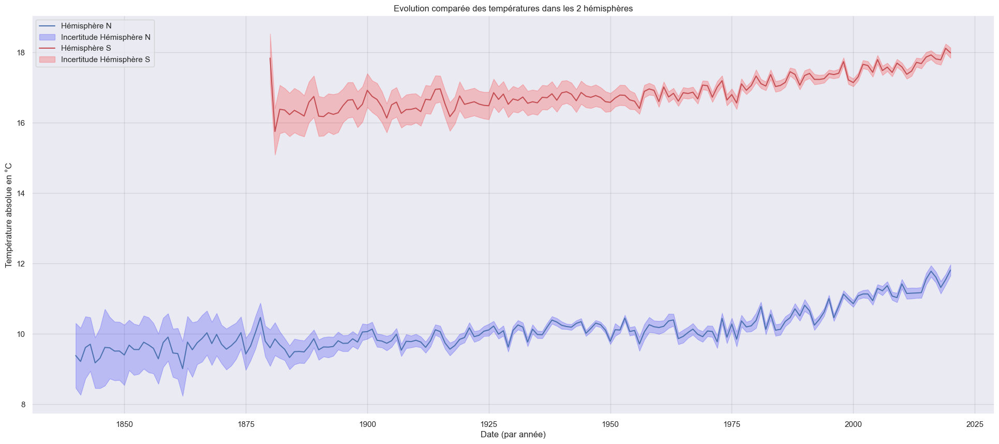

In [25]:
plt.figure(figsize=(24,10))
plt.grid(color='grey', alpha=0.2)# Compute average absolute temperatures by year
temp_year = df_hemisphere.groupby('year').mean().reset_index()

# 
plt.plot(temp_year['year'], temp_year['north_temp_abs'], c= "b", label = 'Hémisphère N')
plt.fill_between(temp_year['year'], 
           temp_year['north_temp_abs'] - temp_year['north_uncert'], 
           temp_year['north_temp_abs'] + temp_year['north_uncert'],
           color="blue", alpha = 0.2, label=('Incertitude '+ 'Hémisphère N'))

plt.plot(temp_year['year'], temp_year['south_temp_abs'], c= "r", label = 'Hémisphère S')
plt.fill_between(temp_year['year'], 
           temp_year['south_temp_abs'] - temp_year['south_uncert'], 
           temp_year['south_temp_abs'] + temp_year['south_uncert'],
           color="red", alpha = 0.2, label=('Incertitude '+ 'Hémisphère S'))



plt.xlabel('Date (par année)')
plt.ylabel('Température absolue en °C')
plt.title('Evolution comparée des températures dans les 2 hémisphères')
plt.legend();


<blockquote style="border-left: 5px solid #686a91;">On remarque sur le graphique ci-dessus une tendance nette à la hausse dans les 2 hémisphères.
Les températures mesurées dans l'hémisphère sud maintiennent un écart positif de 6°C env. par rapport à l'hémisphère nord.
</blocquote>

In [26]:
global_and_hem = df.merge(right = df_hemisphere, on = ['year', 'month'], how = 'outer')
global_and_hem[1500:2500]

,date,year,month,anomaly,uncert,temp_abs,moy_mobile,north_anomaly,north_uncert,north_temp_abs,north_moy_mobile,south_anomaly,south_uncert,south_temp_abs,south_moy_mobile
1500,1875-01-15,1875,1,-1.064,0.618,1.536,8.274667,-1.212,0.545,-3.272,9.931917,NaN,NaN,NaN,NaN
1501,1875-02-15,1875,2,-0.792,0.551,2.408,8.219917,-0.794,0.616,-0.834,9.859083,NaN,NaN,NaN,NaN
1502,1875-03-15,1875,3,-1.061,0.525,4.229,8.232250,-0.887,0.508,3.683,9.870250,NaN,NaN,NaN,NaN
1503,1875-04-15,1875,4,-0.792,0.417,7.488,8.183333,-0.828,0.463,9.522,9.815583,NaN,NaN,NaN,NaN
1504,1875-05-15,1875,5,-0.559,0.408,10.711,8.125083,-0.383,0.354,15.357,9.742000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1957-12-15,1957,12,0.631,0.091,4.261,8.597917,0.551,0.332,0.171,10.057583,0.350,0.220,14.920,16.894917
2496,1958-01-15,1958,1,0.898,0.093,3.498,8.689667,1.064,0.216,-0.996,10.175583,0.248,0.128,13.058,16.926833
2497,1958-02-15,1958,2,0.411,0.126,3.611,8.737500,0.444,0.271,0.404,10.231500,0.313,0.236,12.653,16.970917
2498,1958-03-15,1958,3,0.090,0.084,5.380,8.773917,0.091,0.086,4.661,10.269833,0.280,0.104,13.780,17.004333


In [27]:
# create a dictionary to map numeric values to month names
month_names = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun',
               7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}

# replace numeric values in Month column with month names
global_and_hem['month_str'] = global_and_hem['month'].replace(month_names)
global_and_hem.head()

,date,year,month,anomaly,uncert,temp_abs,moy_mobile,north_anomaly,north_uncert,north_temp_abs,north_moy_mobile,south_anomaly,south_uncert,south_temp_abs,south_moy_mobile,month_str
0,1750-01-15,1750,1,-0.490,3.240,2.110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jan
1,1750-02-15,1750,2,-1.029,3.620,2.171,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Feb
2,1750-03-15,1750,3,0.211,3.079,5.501,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mar
3,1750-04-15,1750,4,-0.166,1.671,8.114,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Apr
4,1750-05-15,1750,5,-1.589,2.514,9.681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,May


In [28]:
# Diagramme polaire des Anomalies de température par mois

# create subplots with polar charts
fig = make_subplots(rows=1, cols=1, subplot_titles=('',),
                    specs=[[{'type': 'polar'}]])

# create traces for each year, with a slider to select the year
for year in global_and_hem['year'].unique():
    trace = go.Scatterpolar(r=global_and_hem[global_and_hem['year']==year]['anomaly'],
                            theta=global_and_hem[global_and_hem['year']==year]['month_str'],
                            name=str(year), # convert Year in string
                            showlegend=False)
    fig.add_trace(trace)

# adjust polar plot layout
fig.update_layout(polar=dict(radialaxis=dict(range=[-3, 3])),
                  updatemenus=[dict(type='buttons',
                                    showactive=False,
                                    buttons=[dict(label='Play',
                                                  method='animate',
                                                  args=[None, {'frame': {'duration': 100, 'redraw': True},
                                                               'fromcurrent': True,
                                                               'transition': {'duration': 0}}]),
                                             dict(label='Pause',
                                                  method='animate',
                                                  args=[[None], {'frame': {'duration': 0, 'redraw': False},
                                                                 'mode': 'immediate',
                                                                 'transition': {'duration': 0}}])])],
                  sliders=[dict(active=0,
                                 yanchor='top',
                                 xanchor='left',
                                 currentvalue=dict(font=dict(size=16), prefix='Year: ', visible=True, xanchor='right'),
                                 pad=dict(t=35, r=20),
                                 len=0.9,
                                 steps=[dict(label=str(year),
                                             method='update',
                                             args=[{'visible': [(i == j) for j in range(len(global_and_hem['year'].unique()))]},
                                                   {'title': "Anomalies de température globales pour l'année {}".format(year)}])
                                        for i, year in enumerate(global_and_hem['year'].unique())])])

fig.update_layout(width=1000, height=600)

fig.show()
pyo.plot(fig, filename="Diagramme polaire des Anomalies de température par mois")


'Diagramme polaire des Anomalies de température par mois.html'

<blockquote style="border-left: 5px solid #686a91;">Le diagramme polaire ci-dessus montre l'évolution des températures au fil des années. Vers les années 1750 les anomalies de températures se rapprochent plus du centre, le centre qui indique une température basse. En faisant défiler les années, on remarque que les courbes s'éloignent du centre et montre nettement un tendance à la hausse des anomalies de températures. Le phénomène de réchauffement climatique semble être réel.</blocquote>

#### L'analyse des données ci-dessous reprend les anomalies de température par pays

In [29]:
temps_countries =pd.read_csv('temperatures_countries.csv')
temps_countries.head()

,date,year,afghanistan,albania,algeria,andorra,angola,anguilla,antarctica,argentina,...,ukraine,united-kingdom,united-states-of-america,uruguay,uzbekistan,venezuela,vietnam,yemen,zambia,zimbabwe
0,1743-11-15,1743,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1744-04-15,1744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1744-05-15,1744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1744-06-15,1744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1744-07-15,1744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


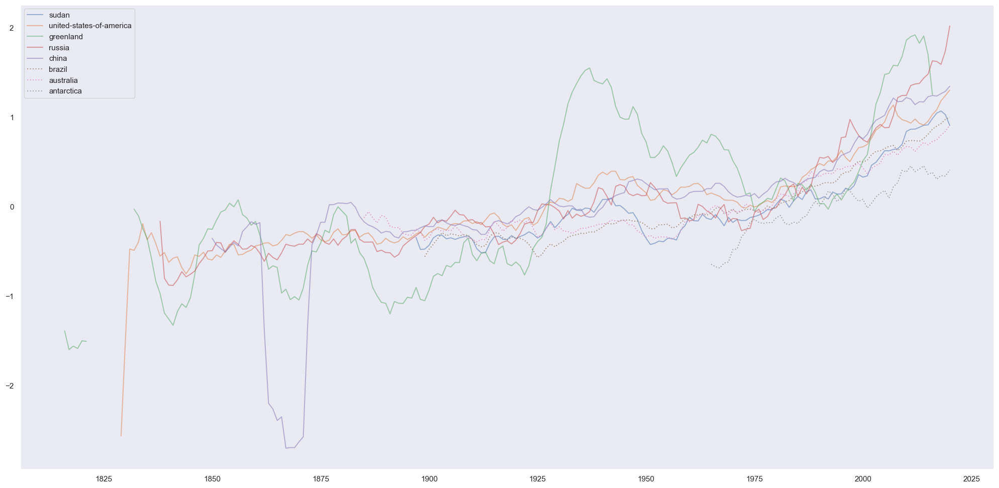

In [30]:
# Compute yearly average
temps_countries_year = pd.DataFrame()
#display(temps_countries)
for c in temps_countries.iloc[:,2:]:
  temps_countries_year[c] = temps_countries.groupby(by='year').agg({c: 'mean'})
temps_countries_year = temps_countries_year.reset_index()

#display(temps_countries_year)
for c in temps_countries_year.iloc[:,1:]:
  temps_countries_year[c] = temps_countries_year[c].rolling(10).mean()

temps_countries_year_centered = temps_countries_year.copy()
for c in temps_countries_year.columns:
  temps_countries_year_centered[c] = temps_countries_year[c] - temps_countries_year[c].mean()

selected_countries_n = ['sudan', 'united-states-of-america', 
                      'greenland', 
                      'russia', 
                      'china']
selected_countries_s = ['brazil',
                      'australia', 'antarctica']

plt.figure(figsize=(25,12))
#plt.ylim(-.5, 2)
for c in selected_countries_n:
  plt.plot(temps_countries_year['year'], temps_countries_year_centered[c], alpha=.5, label=c, linestyle='-')
for c in selected_countries_s:
  plt.plot(temps_countries_year['year'], temps_countries_year_centered[c], alpha=.7, label=c, linestyle=':')
plt.grid()
plt.legend()
plt.show()

<blockquote style="border-left: 5px solid #686a91;">Ce graphique montre les évolutions de températures entre quelques pays de l'hémisphère nord et quelques pyas de l'émisphère sud. 
On peut remarquer une hausse brusque et rapide des températures des pays de l'hémisphère nord ( courbe en trait plein) tandisque les pays du sud on un changement de température plutôt lent et relativement stable (courbe en pointillé).

Notons que les pays du sud sont des pays faiblement industrialisés mais aussi des pays avec des températures chaudes ou tropicales.
</blocquote>

In [31]:
temps_countries_year

,year,afghanistan,albania,algeria,andorra,angola,anguilla,antarctica,argentina,armenia,...,ukraine,united-kingdom,united-states-of-america,uruguay,uzbekistan,venezuela,vietnam,yemen,zambia,zimbabwe
0,1743,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1745,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1751,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269,2016,15.082292,14.176217,24.409017,12.299483,22.874458,27.462273,-24.322000,15.297200,8.850283,...,9.348000,9.395208,9.737475,17.993608,13.795900,26.238658,24.635625,27.161658,22.190675,21.977892
270,2017,15.134592,14.173750,24.435717,12.366683,22.850708,NaN,-24.396650,15.425875,8.925725,...,9.308683,9.401575,9.789867,18.142692,13.793817,26.260225,24.665225,27.194150,22.191933,21.964800
271,2018,15.209017,14.237775,24.457892,12.434592,22.908100,NaN,-24.356642,15.436700,9.135775,...,9.316417,9.445750,9.891417,18.155183,13.821583,26.280833,24.746408,27.260725,22.257525,22.011592
272,2019,15.225625,14.295150,24.456225,12.449692,22.989950,NaN,-24.363075,15.438217,9.250533,...,9.424400,9.474600,9.949800,18.194150,13.906333,26.296942,24.831108,27.309092,22.352942,22.119292


In [32]:
import pandas as pd
import plotly.graph_objects as go

# Charger les données depuis un fichier CSV ou tout autre source de données
data = temps_countries_year

# Créer une liste de noms de pays
pays = data.columns.tolist()

# Créer une liste d'années
annees = data['year'].tolist()

# Créer la trace Choropleth pour chaque année
traces = []
for i, annee in enumerate(annees):
    trace = go.Choropleth(
        locations=pays,
        locationmode='country names',
        z=data.iloc[i, 1:].tolist(),  # Les températures pour l'année donnée
        autocolorscale=False,  # Désactiver la mise à l'échelle automatique des couleurs
        colorscale='Rainbow',  # Définir une échelle de couleur spécifique
        colorbar=dict(title='Température')
    )
    traces.append(trace)

# Créer la figure
fig = go.Figure(data=traces)

# Personnaliser le layout
fig.update_layout(
    title='Évolution des températures par pays',
    geo=dict(showframe=False, showcoastlines=False, projection_type='equirectangular')
)

# Afficher la figure
fig.show()


In [34]:
import pandas as pd
import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display

# Charger les données depuis un fichier CSV ou tout autre source de données
data = temps_countries_year
# Créer une liste de noms de pays
pays = data.columns.tolist()

# Créer une liste d'années
annees = data['year'].tolist()

# Créer la trace Choropleth initiale
fig = go.Figure(data=go.Choropleth(
    locations=pays,
    locationmode='country names',
    z=data.iloc[0, 1:].tolist(),  # Les températures pour la première année
    autocolorscale=False,  # Désactiver la mise à l'échelle automatique des couleurs
        colorscale='viridis',  # Définir une échelle de couleur spécifique
    colorbar=dict(title='Température')
))

# Personnaliser le layout initial
fig.update_layout(
    title='Évolution des températures par pays',
    geo=dict(showframe=False, showcoastlines=False, projection_type='equirectangular')
)

# Créer la fonction de mise à jour de la carte
def update_map(year):
    fig.data[0].z = data.iloc[year, 1:].tolist()  # Mettre à jour les températures
    fig.update_layout(title=f'Évolution des températures par pays - Année {annees[year]}')

# Créer le widget de sélection de l'année
year_slider = widgets.IntSlider(
    value=0,
    min=0,
    max=len(annees) - 1,
    step=1,
    description='Année:',
    continuous_update=False
)

# Créer le bouton "play"
play_button = widgets.Play(
    value=0,
    min=0,
    max=len(annees) - 1,
    step=1,
    interval=500,  # Intervalle de temps entre chaque année en millisecondes
    description='Play',
    disabled=False
)

# Lier le bouton "play" et le widget de sélection de l'année à la fonction de mise à jour de la carte
widgets.jslink((play_button, 'value'), (year_slider, 'value'))

# Créer la sortie de texte pour afficher l'année sélectionnée
output = widgets.Output()

# Définir la fonction de mise à jour de la sortie de texte
#def update_output(year):
#    with output:
#        print(f"Année sélectionnée: {annees[year]}")

# Lier la fonction de mise à jour de la sortie de texte au widget de sélection de l'année
#widgets.interact(update_output, year=year_slider)

# Afficher le widget et la carte
display(widgets.VBox([play_button, year_slider, output]))
fig.show()


In [35]:
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
from IPython.display import display

# Charger les données depuis un fichier CSV ou tout autre source de données
data = temps_countries_year
# Créer une liste de noms de pays
pays = data.columns.tolist()

# Créer une liste d'années
annees = data['year'].tolist()

# Créer la trace Choropleth initiale
fig = go.Figure(data=go.Choropleth(
    locations=pays,
    locationmode='country names',
    z=data.iloc[0, 1:].tolist(),  # Les températures pour la première année
    text=pays,
    autocolorscale=False,  # Désactiver la mise à l'échelle automatique des couleurs
    colorscale='Rainbow',  # Définir une échelle de couleur spécifique
    colorbar=dict(title='Température')
))

# Personnaliser le layout initial
fig.update_layout(
    title='Évolution des températures par pays',
    geo=dict(showframe=False, showcoastlines=False, projection_type='equirectangular')
)

# Créer les frames pour chaque année
frames = []
for i, annee in enumerate(annees):
    frame = go.Frame(
        data=[go.Choropleth(
            locations=pays,
            locationmode='country names',
            z=data.iloc[i, 1:].tolist(),  # Les températures pour l'année donnée
            text=pays
        )],
        name=str(annee)
    )
    frames.append(frame)

# Ajouter les frames à l'animation
fig.frames = frames

# Définir les propriétés de l'animation
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            buttons=[
                dict(
                    label="Play",
                    method="animate",
                    args=[None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}]
                    
                ),
                dict(
                    label="Pause",
                    method="animate",
                    args=[[None], {"frame": {"duration": 0, "redraw": False}, "mode": "immediate"}]
                )
            ],
            showactive=False,
            direction="left",
            pad={"r": 10, "t": 10},
            x=0.1,
            xanchor="right",
            y=0,
            yanchor="top"
        ),
    ]
)

# Afficher l'animation
display(fig)
